![alt text](PaletteSkills_Banner.png "Banner")
# Assignment 5

### Objective
The objective of this assignment is to analyze the Rural Municipality Yield Data from 1938 to 2021 and identify any trends, patterns or insights that can be derived from the data. This assignment is designed to provide students with hands-on experience in data science, including data cleaning, exploration, visualization, feature selection an machine learning model deployment.

### Data:

1. **Yield Data**
The Rural Municipality Yield Data Contains the yield data for crops grown in rural municipalities from 1938 to 2021. The data includes the following fields:

- **Year:** The year for which the yield data was collected.
- **Municipality:** The name of the rural municipality. 
- **Crops:** The type of crops grown.
- **Yield (bu/acre):** The yield of the crop in kilograms per hectare.

2. **GIS Data**

- **Clean and prepare the data.** This may include removing missing values, handling outliers, and transforming the data if necessary.

- **Explore the data** by generating summary statistics, creating visualizations, and identifying trends, patterns, and outliers.

- **Perform statistical analysis** on the data, such as regression analysis and supervised or unsupervised ML (One Supervised and One Unsupervised Required) to understand the relationship between different variables and the yield of crops.

- **Develop insights and conclusions based** on your analysis.For example, you
might identify which crops have the highest yields, which rural municipalities
have the most productive farmland, or which years had the best yields overall.



In [125]:
import pandas as pd # Library for data handling
import numpy as np # matrix operations
import geopandas as gpd
import matplotlib.pyplot as plt
import folium
import branca as bc
import seaborn as sns
from mapclassify import classify
plt.rcParams['figure.figsize'] = (20, 12)

In [10]:
rm_crop_yields = pd.read_csv('rm_crop_yields_1938_2021.csv')
geo_df = gpd.read_file('Rural Municipality\Rural Municipality.shp')

In [12]:
rm_crop_yields.head()
#rm_crop_yields.info()

,Year,RM,Winter Wheat,Canola,Spring Wheat,Mustard,Durum,Sunflowers,Oats,Lentils,Peas,Barley,Fall Rye,Canary Seed,Spring Rye,Tame Hay,Flax,Chickpeas
0,1938,1,NaN,NaN,4.0,NaN,NaN,NaN,1.0,NaN,NaN,1.0,NaN,NaN,NaN,NaN,0.0,NaN
1,1939,1,NaN,NaN,9.0,NaN,NaN,NaN,16.0,NaN,NaN,16.0,NaN,NaN,NaN,NaN,0.0,NaN
2,1940,1,NaN,NaN,12.0,NaN,NaN,NaN,23.0,NaN,NaN,19.0,NaN,NaN,NaN,NaN,8.0,NaN
3,1941,1,NaN,NaN,18.0,NaN,NaN,NaN,32.0,NaN,NaN,28.0,NaN,NaN,NaN,NaN,5.0,NaN
4,1942,1,NaN,NaN,20.0,NaN,NaN,NaN,35.0,NaN,NaN,28.0,14.0,NaN,NaN,NaN,5.0,NaN


In [68]:
geo_df.head()


,PPID,EFFDT,EXPDT,FEATURECD,RMNO,RMNM,SHAPE_AREA,SHAPE_LEN,geometry
0,0101000095,2019-01-21,NaN,RMPPID,095,GOLDEN WEST,8.101431e+08,265851.388799,"POLYGON ((654081.000 5546088.320, 654885.320 5..."
1,0101000378,2019-07-29,NaN,RMPPID,378,ROSEMOUNT,5.844701e+08,161271.937167,"POLYGON ((265258.740 5810148.180, 266062.740 5..."
2,0101000288,2015-01-27,NaN,RMPPID,288,PLEASANT VALLEY,8.532007e+08,116895.097209,"POLYGON ((254141.490 5701256.420, 254179.510 5..."
3,0101000106,2019-04-24,NaN,RMPPID,106,WHISKA CREEK,8.526283e+08,129288.281136,"POLYGON ((339874.810 5539057.770, 339849.430 5..."
4,0101000132,2019-07-16,NaN,RMPPID,132,HILLSBOROUGH,6.343913e+08,103052.690196,"POLYGON ((445175.620 5573313.600, 445572.880 5..."


In [41]:
geo_df.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 298 entries, 0 to 297
Data columns (total 9 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   PPID        298 non-null    object  
 1   EFFDT       298 non-null    object  
 2   EXPDT       0 non-null      float64 
 3   FEATURECD   298 non-null    object  
 4   RMNO        298 non-null    object  
 5   RMNM        298 non-null    object  
 6   SHAPE_AREA  298 non-null    float64 
 7   SHAPE_LEN   298 non-null    float64 
 8   geometry    298 non-null    geometry
dtypes: float64(3), geometry(1), object(5)
memory usage: 21.1+ KB


In [69]:
# Drop rows with RMNO of 998 or 999
geo_df = geo_df.drop(geo_df[geo_df['RMNM'].isin(['NORTHERN ADMIN DISTRICT'])].index)



In [98]:
#read the csv file rural_municipalities.csv
rural = pd.read_csv(r"C:\Users\jason\Desktop\Palette_Training\Palette_Training_4-main\rural_municipalities.csv")

In [99]:
#display the first 5 rows of the dataframe
rural.head()

,Ruralmunicipality (RM)[5],RMNo.[5],SARMDiv. No.,CensusDiv. No.,Incorporationdate[6],Population(2016)[4],Population(2011)[4],Change(%)[4],Landarea(km²)[4],Populationdensity(per km²)[4]
0,Aberdeen No. 373,373,5,15.0,"December 13, 1909","1,379","1,016",+35.7%,673.42,2.0/km2
1,Abernethy No. 186,186,1,6.0,"December 11, 1911",362,387,−6.5%,779.42,0.5/km2
2,Antelope Park No. 322,322,6,13.0,"December 11, 1911",130,150,−13.3%,612.9,0.2/km2
3,Antler No. 61,61,1,1.0,"December 13, 1909",523,577,−9.4%,832.81,0.6/km2
4,Arborfield No. 456,456,4,14.0,"January 1, 1913",343,453,−24.3%,"1,416.01",0.2/km2


In [100]:
rural.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 297 entries, 0 to 296
Data columns (total 10 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Ruralmunicipality (RM)[5]      297 non-null    object 
 1   RMNo.[5]                       297 non-null    object 
 2   SARMDiv. No.                   297 non-null    object 
 3   CensusDiv. No.                 296 non-null    float64
 4   Incorporationdate[6]           296 non-null    object 
 5   Population(2016)[4]            296 non-null    object 
 6   Population(2011)[4]            296 non-null    object 
 7   Change(%)[4]                   296 non-null    object 
 8   Landarea(km²)[4]               296 non-null    object 
 9   Populationdensity(per km²)[4]  296 non-null    object 
dtypes: float64(1), object(9)
memory usage: 23.3+ KB


In [101]:
#rename the column RM No. to RM
rural.rename(columns={"RMNo.[5]": "RM"}, inplace=True)

In [102]:
rural["RM"] = rural["RM"].str.replace(",", "").astype("int64")

In [103]:
#change the type of the column RM to int64
rural["RM"] = rural["RM"].astype("int64")

In [104]:
df = rm_crop_yields

In [105]:
#merge the two dataframes
df = df.merge(rural, on="RM" , how="left") 

In [146]:
#display the first 5 rows of the dataframe
df.head()

,Year,RM,Winter Wheat,Canola,Spring Wheat,Mustard,Durum,Sunflowers,Oats,Lentils,...,Chickpeas,Ruralmunicipality (RM)[5],SARMDiv. No.,CensusDiv. No.,Incorporationdate[6],Population(2016)[4],Population(2011)[4],Change(%)[4],Landarea(km²)[4],Populationdensity(per km²)[4]
0,1938,1,0.0,0.0,4.0,0.0,0.0,0.0,1.0,0.0,...,0.0,Argyle No. 1,1,1.0,"December 19, 1912",290,270,+7.4%,579.88,0.5/km2
1,1939,1,0.0,0.0,9.0,0.0,0.0,0.0,16.0,0.0,...,0.0,Argyle No. 1,1,1.0,"December 19, 1912",290,270,+7.4%,579.88,0.5/km2
2,1940,1,0.0,0.0,12.0,0.0,0.0,0.0,23.0,0.0,...,0.0,Argyle No. 1,1,1.0,"December 19, 1912",290,270,+7.4%,579.88,0.5/km2
3,1941,1,0.0,0.0,18.0,0.0,0.0,0.0,32.0,0.0,...,0.0,Argyle No. 1,1,1.0,"December 19, 1912",290,270,+7.4%,579.88,0.5/km2
4,1942,1,0.0,0.0,20.0,0.0,0.0,0.0,35.0,0.0,...,0.0,Argyle No. 1,1,1.0,"December 19, 1912",290,270,+7.4%,579.88,0.5/km2


In [147]:
df.fillna(0, inplace=True)

In [148]:
df.columns

Index(['Year', 'RM', 'Winter Wheat', 'Canola', 'Spring Wheat', 'Mustard',
       'Durum', 'Sunflowers', 'Oats', 'Lentils', 'Peas', 'Barley', 'Fall Rye',
       'Canary Seed', 'Spring Rye', 'Tame Hay', 'Flax', 'Chickpeas',
       'Ruralmunicipality (RM)[5]', 'SARMDiv. No.', 'CensusDiv. No.',
       'Incorporationdate[6]', 'Population(2016)[4]', 'Population(2011)[4]',
       'Change(%)[4]', 'Landarea(km²)[4]', 'Populationdensity(per km²)[4]'],
      dtype='object')

In [149]:
df.isna().sum()

Year                             0
RM                               0
Winter Wheat                     0
Canola                           0
Spring Wheat                     0
Mustard                          0
Durum                            0
Sunflowers                       0
Oats                             0
Lentils                          0
Peas                             0
Barley                           0
Fall Rye                         0
Canary Seed                      0
Spring Rye                       0
Tame Hay                         0
Flax                             0
Chickpeas                        0
Ruralmunicipality (RM)[5]        0
SARMDiv. No.                     0
CensusDiv. No.                   0
Incorporationdate[6]             0
Population(2016)[4]              0
Population(2011)[4]              0
Change(%)[4]                     0
Landarea(km²)[4]                 0
Populationdensity(per km²)[4]    0
dtype: int64

In [150]:
df['RM'].unique()

array([  1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,  17,
        18,  19,  31,  32,  33,  34,  35,  36,  37,  38,  39,  40,  42,
        43,  44,  45,  46,  49,  51,  61,  63,  64,  65,  66,  67,  68,
        69,  70,  71,  72,  73,  74,  75,  76,  77,  78,  79,  91,  92,
        93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103, 104, 105,
       106, 107, 108, 109, 110, 111, 121, 122, 123, 124, 125, 126, 127,
       128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 141,
       142, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162,
       163, 164, 165, 166, 167, 168, 169, 171, 181, 183, 184, 185, 186,
       187, 189, 190, 191, 193, 194, 211, 213, 214, 215, 216, 217, 218,
       219, 220, 221, 222, 223, 224, 225, 226, 228, 229, 230, 231, 232,
       241, 243, 244, 245, 246, 247, 248, 250, 251, 252, 253, 254, 255,
       256, 257, 259, 260, 261, 271, 273, 274, 275, 276, 277, 278, 279,
       280, 281, 282, 283, 284, 285, 286, 287, 288, 290, 292, 30

In [151]:
RM = df['RM'].unique()

In [152]:
df.groupby('RM')['Canola'].mean().sort_values(ascending=False).head(10)

RM
404    18.945119
403    18.541667
471    18.359524
439    18.328095
431    18.276190
442    18.099881
472    18.003452
493    17.986786
369    17.980000
463    17.955952
Name: Canola, dtype: float64

In [169]:
#create a new dataframe with the mean of the crop yields for each RM
df_mean = df.groupby('Year').mean()

#remove the column Year, Area and Population
df_mean = df_mean.drop(['RM'], axis=1)

<AxesSubplot:xlabel='Year'>

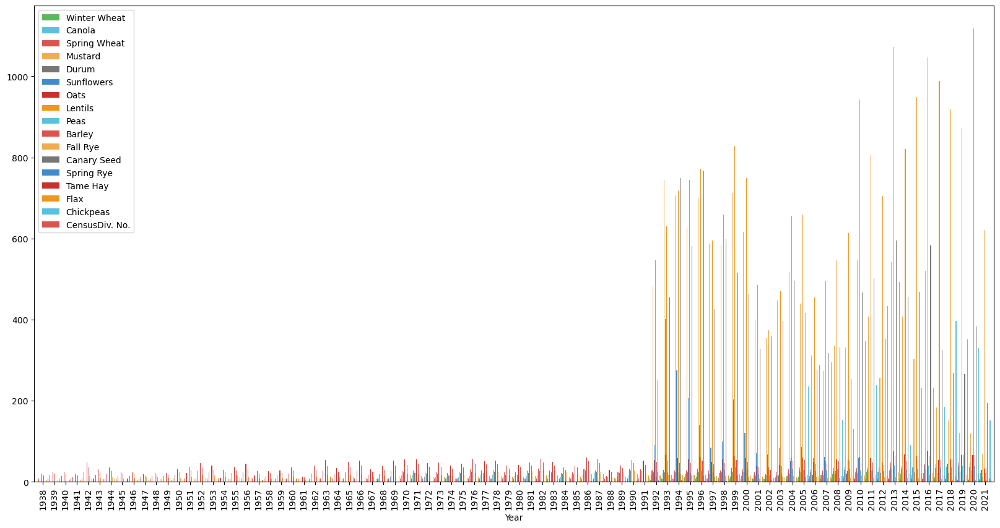

In [170]:
#create a plot of the mean of the crop yields for each RM
df_mean.plot(kind='bar', figsize=(20,10), width=1, color=['#5cb85c', '#5bc0de', '#d9534f', '#f0ad4e', '#777777', '#428bca', '#c9302c', '#ec971f', '#5bc0de', '#d9534f', '#f0ad4e', '#777777', '#428bca', '#c9302c', '#ec971f', '#5bc0de', '#d9534f', '#f0ad4e', '#777777', '#428bca', '#c9302c', '#ec971f', '#5bc0de', '#d9534f', '#f0ad4e', '#777777', '#428bca', '#c9302c', '#ec971f', '#5bc0de', '#d9534f', '#f0ad4e', '#777777', '#428bca', '#c9302c', '#ec971f', '#5bc0de', '#d9534f', '#f0ad4e', '#777777', '#428bca', '#c9302c', '#ec971f', '#5bc0de', '#d9534f', '#f0ad4e', '#777777', '#428bca', '#c9302c', '#ec971f', '#5bc0de', '#d9534f', '#f0ad4e', '#777777', '#428bca', '#c9302c', '#ec971f', '#5bc0de', '#d9534f', '#f0ad4e', '#777777', '#428bca', '#c9302c', '#ec971f', '#5bc0de', '#d9534f', '#f0ad4e', '#777777', '#428bca', '#c9302c', '#ec971f', '#5bc0de', '#d9534f', '#f0ad4e', '#777777', '#428bca', '#c9302c', '#ec971f', '#5bc0de', '#d9534f', '#f0ad4e', '#777777', '#428bca', '#c9302c', '#ec971f', '#5bc0de'])


In [120]:
df.groupby('Year')['Canola'].mean().sort_values(ascending=False).head(10)

Year
2016    41.323051
2019    40.091864
2013    37.665763
2020    37.586441
2018    36.178983
2015    35.571220
2017    33.351661
2014    32.091085
2011    29.738983
2010    29.417288
Name: Canola, dtype: float64

In [156]:
#create a new dataframe with groupby Year and mean of the crop yields
df_year = df.groupby('Year').mean()

In [158]:
#remove the column RM, CensusDiv. No.
df_year = df_year.drop(['RM', 'CensusDiv. No.'], axis=1)

Text(0.5, 1.0, 'Mean of the crop yields for each RM')

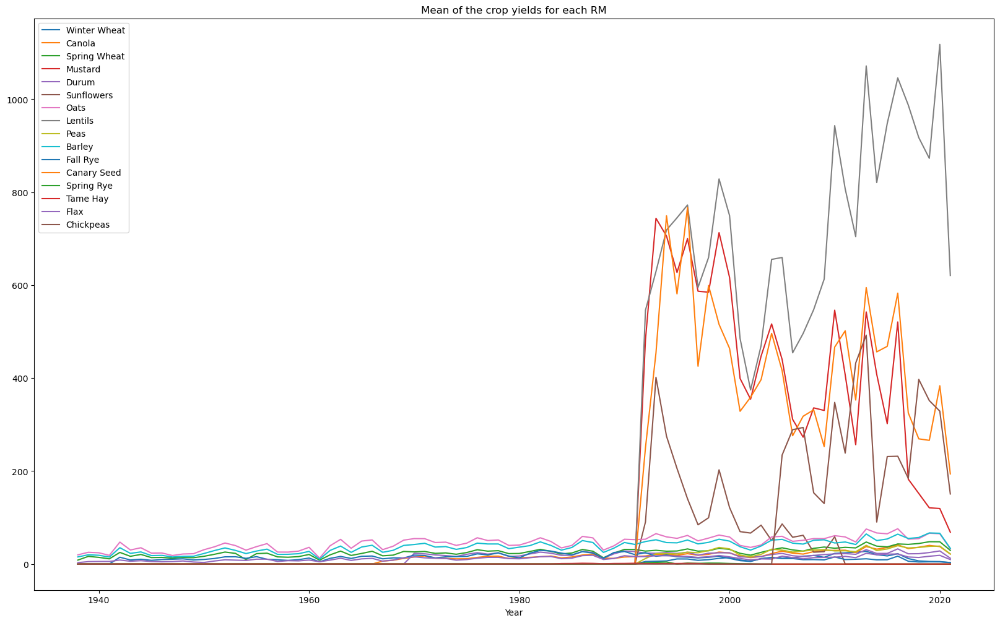

In [163]:
#create a line plot of the mean of the crop yields for each RM
df_year.plot.line()

#add a title to the plot
plt.title('Mean of the crop yields for each RM')

In [121]:
df2 = df[['Year', 'RM', 'Winter Wheat', 'Canola', 'Spring Wheat', 'Mustard',
       'Durum', 'Sunflowers', 'Oats', 'Lentils', 'Peas', 'Barley', 'Fall Rye',
       'Canary Seed', 'Spring Rye', 'Tame Hay', 'Flax', 'Chickpeas',
       'Ruralmunicipality (RM)[5]', 'SARMDiv. No.', 'CensusDiv. No.',
       'Incorporationdate[6]', 'Population(2016)[4]', 'Population(2011)[4]',
       'Change(%)[4]', 'Landarea(km²)[4]', 'Populationdensity(per km²)[4]']]
df2.corr()

,Year,RM,Winter Wheat,Canola,Spring Wheat,Mustard,Durum,Sunflowers,Oats,Lentils,Peas,Barley,Fall Rye,Canary Seed,Spring Rye,Tame Hay,Flax,Chickpeas,CensusDiv. No.
Year,1.000000,-0.006441,0.411261,0.810601,0.651602,0.436185,0.569568,0.117552,0.443411,0.578544,0.754971,0.638961,0.054983,0.423773,0.063171,0.175285,0.438903,0.256751,0.003946
RM,-0.006441,1.000000,-0.111920,0.166386,0.175609,-0.135293,-0.255498,-0.089448,0.201028,-0.143637,0.038163,0.131867,-0.040242,-0.009391,0.032097,0.033949,-0.023219,-0.150859,0.926888
Winter Wheat,0.411261,-0.111920,1.000000,0.371387,0.295661,0.388951,0.273749,0.151749,0.246614,0.353777,0.469353,0.299423,0.146093,0.360653,0.057291,-0.035146,0.294765,0.202125,-0.113004
Canola,0.810601,0.166386,0.371387,1.000000,0.743696,0.371187,0.500914,0.095447,0.551359,0.512065,0.727252,0.733795,0.081396,0.399608,0.049150,0.145439,0.520340,0.210983,0.150733
Spring Wheat,0.651602,0.175609,0.295661,0.743696,1.000000,0.218178,0.388871,0.043178,0.721135,0.376223,0.628257,0.862724,0.148328,0.330699,0.036753,0.106236,0.513317,0.119131,0.158678
Mustard,0.436185,-0.135293,0.388951,0.371187,0.218178,1.000000,0.437939,0.283385,0.163769,0.582445,0.523564,0.283196,0.082356,0.473457,0.127545,0.121107,0.305572,0.230052,-0.102902
Durum,0.569568,-0.255498,0.273749,0.500914,0.388871,0.437939,1.000000,0.143467,0.196945,0.543756,0.372861,0.434924,0.241470,0.332866,0.057725,0.252186,0.477213,0.271339,-0.209260
Sunflowers,0.117552,-0.089448,0.151749,0.095447,0.043178,0.283385,0.143467,1.000000,0.076609,0.192206,0.159782,0.090964,0.076800,0.209552,0.127069,0.109261,0.121520,0.007523,-0.083026
Oats,0.443411,0.201028,0.246614,0.551359,0.721135,0.163769,0.196945,0.076609,1.000000,0.136340,0.439908,0.751245,0.212417,0.279932,0.050052,0.145934,0.447362,-0.063239,0.176571
Lentils,0.578544,-0.143637,0.353777,0.512065,0.376223,0.582445,0.543756,0.192206,0.136340,1.000000,0.659754,0.370534,-0.043991,0.456484,0.088233,0.004689,0.345647,0.370444,-0.103391


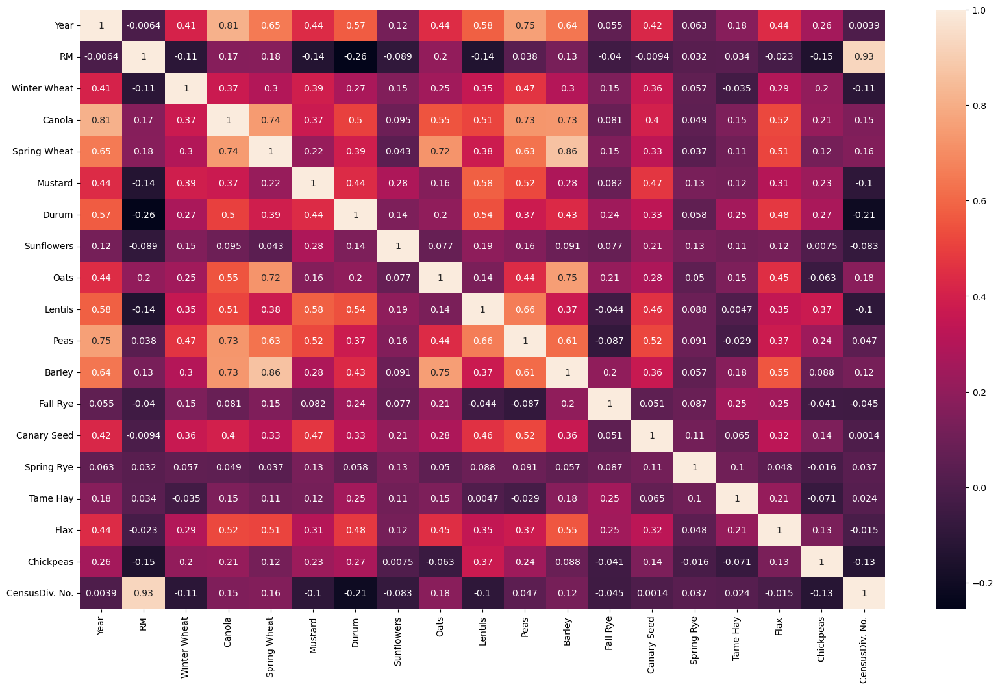

In [126]:
# Plot a heatmap to visualize the correlation matrix
corr_matrix = df2.corr()
sns.heatmap(corr_matrix, annot=True)
plt.show()

In [129]:
print(X.shape)
print(RM.shape)

(25017, 27)
(299,)


In [138]:
#create a machine learning model to predict RM based on X for the next 5 years.
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score

# create a new dataframe with the relevant columns
df2 = df[['Year', 'RM', 'Winter Wheat', 'Canola', 'Spring Wheat', 'Mustard',
       'Durum', 'Sunflowers', 'Oats', 'Lentils', 'Peas', 'Barley', 'Fall Rye',
       'Canary Seed', 'Spring Rye', 'Tame Hay', 'Flax', 'Chickpeas',
       'Ruralmunicipality (RM)[5]', 'SARMDiv. No.', 'CensusDiv. No.',
       'Incorporationdate[6]', 'Population(2016)[4]', 'Population(2011)[4]',
       'Change(%)[4]', 'Landarea(km²)[4]', 'Populationdensity(per km²)[4]']]

# split into features (X) and target (y)
X = df2[['Year', 'Winter Wheat', 'Canola', 'Spring Wheat', 'Mustard',
       'Durum', 'Sunflowers', 'Oats', 'Lentils', 'Peas', 'Barley', 'Fall Rye',
       'Canary Seed', 'Spring Rye', 'Tame Hay', 'Flax', 'Chickpeas', 'SARMDiv. No.', 'CensusDiv. No.']]
y = df2['RM']

# split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# train a linear regression model
reg = LinearRegression()
reg.fit(X_train, y_train)

# make predictions on the testing set
y_pred = reg.predict(X_test)

# print the model performance metrics
print('Coefficients: ', reg.coef_)
print('Intercept: ', reg.intercept_)
print('Mean squared error: %.2f' % mean_squared_error(y_test, y_pred))
print('Coefficient of determination: %.2f' % r2_score(y_test, y_pred))


Coefficients:  [-2.39512952e-01 -2.03975191e-02  1.35751465e+00  5.10950396e-01
 -4.26739295e-03 -8.13380386e-01 -2.82819558e-03  4.74312062e-02
 -7.59429703e-03 -1.52623092e-01 -1.64768733e-01  3.89117813e-02
  2.99195320e-03  2.21628176e-01  7.15163358e+00 -3.81876450e-01
 -5.95715152e-03 -7.84999726e+00  2.92609156e+01]
Intercept:  487.6729379424148
Mean squared error: 2572.28
Coefficient of determination: 0.88


Missing values: 0
Number of duplicates: 0


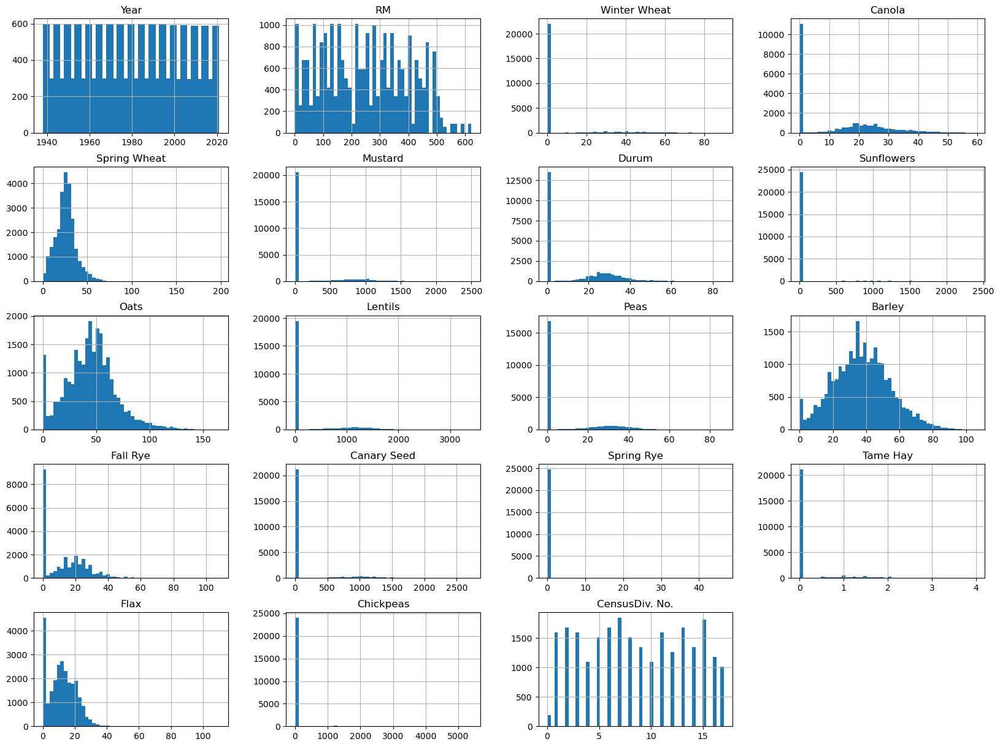

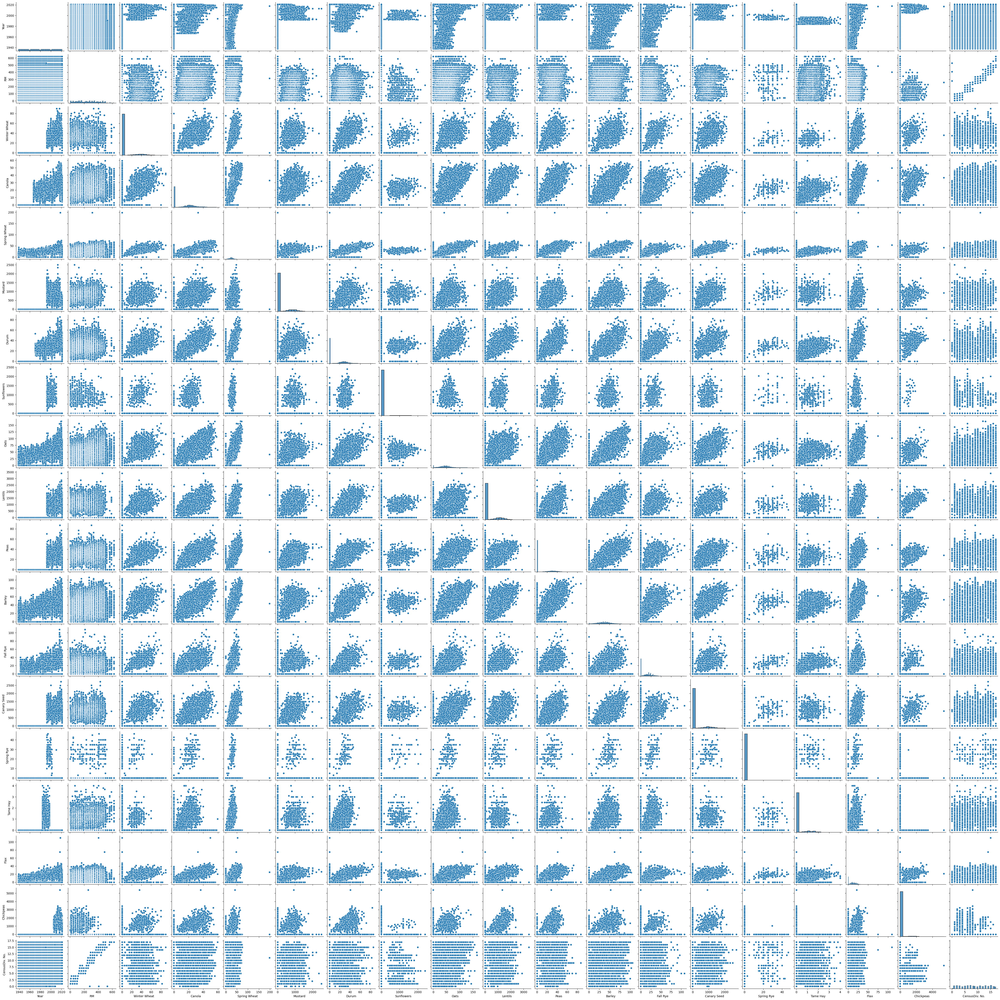

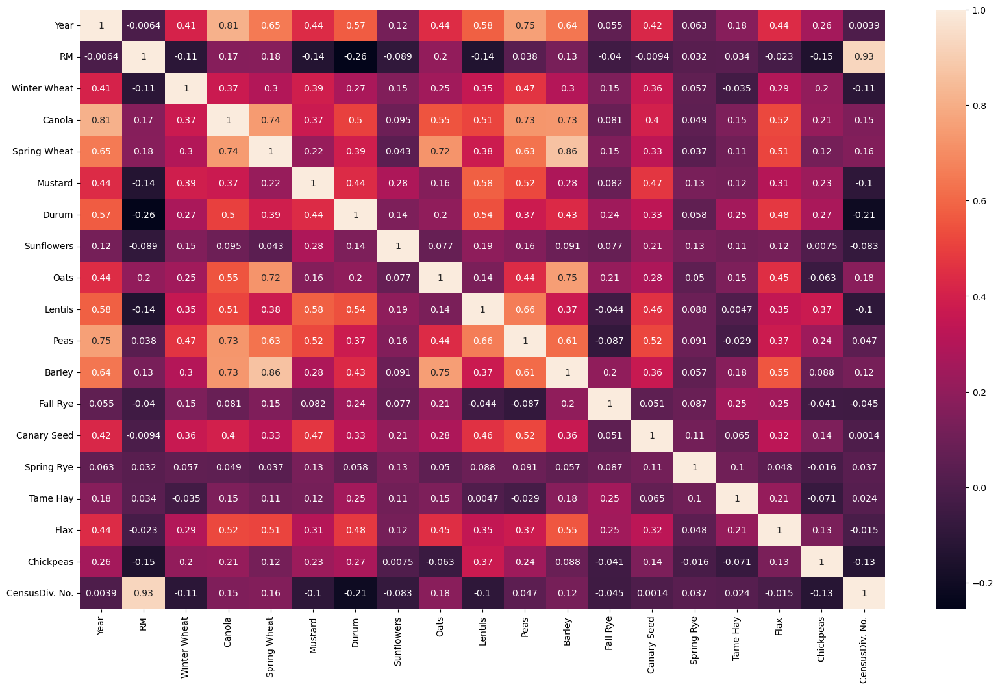

In [139]:
# Check for missing values
print("Missing values:", df.isnull().sum().sum())

# Check for duplicates
print("Number of duplicates:", df.duplicated().sum())

# Plot histograms to visualize the distribution of the variables
df.hist(bins=50, figsize=(20,15))
plt.show()

# Plot scatterplots to visualize the relationships between the variables
sns.pairplot(df)
plt.show()

# Plot a heatmap to visualize the correlation matrix
corr_matrix = df.corr()
sns.heatmap(corr_matrix, annot=True)
plt.show()

In [140]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

reg = DecisionTreeRegressor()
reg.fit(X_train, y_train)

y_pred = reg.predict(X_test)

print('Mean squared error: %.2f' % mean_squared_error(y_test, y_pred))
print('Coefficient of determination: %.2f' % r2_score(y_test, y_pred))

Mean squared error: 2152.59
Coefficient of determination: 0.90


In [ ]:
geo_df.explore(
    column='SHAPE_AREA',
    scheme="naturalbreaks",  # use mapclassify's natural breaks scheme
    tiles='Cartodb dark_matter', # map background type
    cmap='Reds',
    k=5,
    legend=True,
    tooltip=['RMNM', 'RMNO', 'SHAPE_AREA'],
    popup=True, # show all values in popup (on click)
    style_kwds=dict(color="black") # use black outline

)



In [116]:
# Create the map using the explore() method
map_obj = geo_df.explore(
    column='SHAPE_AREA',
    scheme="naturalbreaks",
    tiles='Cartodb dark_matter',
    cmap='Reds',
    k=5,
    legend=True,
    tooltip=['RMNM', 'RMNO', 'SHAPE_AREA'],
    popup=True,
    style_kwds=dict(color="black")
)

# Save the map as a PNG image
map_obj.save("map1.png", width=800, height=600)

![alt text](map1.png "Banner")

In [171]:
df2

,Year,RM,Winter Wheat,Canola,Spring Wheat,Mustard,Durum,Sunflowers,Oats,Lentils,...,Chickpeas,Ruralmunicipality (RM)[5],SARMDiv. No.,CensusDiv. No.,Incorporationdate[6],Population(2016)[4],Population(2011)[4],Change(%)[4],Landarea(km²)[4],Populationdensity(per km²)[4]
0,1938,1,0.0,0.00,4.00,0.0,0.0,0.0,1.00,0.0,...,0.0,Argyle No. 1,1,1.0,"December 19, 1912",290,270,+7.4%,579.88,0.5/km2
1,1939,1,0.0,0.00,9.00,0.0,0.0,0.0,16.00,0.0,...,0.0,Argyle No. 1,1,1.0,"December 19, 1912",290,270,+7.4%,579.88,0.5/km2
2,1940,1,0.0,0.00,12.00,0.0,0.0,0.0,23.00,0.0,...,0.0,Argyle No. 1,1,1.0,"December 19, 1912",290,270,+7.4%,579.88,0.5/km2
3,1941,1,0.0,0.00,18.00,0.0,0.0,0.0,32.00,0.0,...,0.0,Argyle No. 1,1,1.0,"December 19, 1912",290,270,+7.4%,579.88,0.5/km2
4,1942,1,0.0,0.00,20.00,0.0,0.0,0.0,35.00,0.0,...,0.0,Argyle No. 1,1,1.0,"December 19, 1912",290,270,+7.4%,579.88,0.5/km2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25012,2017,622,0.0,43.06,59.49,0.0,0.0,0.0,93.01,0.0,...,0.0,Beaver River No. 622,6,17.0,"January 1, 1978","1,216","1,017",+19.6%,"2,370.09",0.5/km2
25013,2018,622,0.0,39.30,59.50,0.0,0.0,0.0,96.40,0.0,...,0.0,Beaver River No. 622,6,17.0,"January 1, 1978","1,216","1,017",+19.6%,"2,370.09",0.5/km2
25014,2019,622,0.0,46.10,63.90,0.0,0.0,0.0,106.00,0.0,...,0.0,Beaver River No. 622,6,17.0,"January 1, 1978","1,216","1,017",+19.6%,"2,370.09",0.5/km2
25015,2020,622,0.0,40.90,55.10,0.0,0.0,0.0,94.50,0.0,...,0.0,Beaver River No. 622,6,17.0,"January 1, 1978","1,216","1,017",+19.6%,"2,370.09",0.5/km2


In [172]:
df2.columns

Index(['Year', 'RM', 'Winter Wheat', 'Canola', 'Spring Wheat', 'Mustard',
       'Durum', 'Sunflowers', 'Oats', 'Lentils', 'Peas', 'Barley', 'Fall Rye',
       'Canary Seed', 'Spring Rye', 'Tame Hay', 'Flax', 'Chickpeas',
       'Ruralmunicipality (RM)[5]', 'SARMDiv. No.', 'CensusDiv. No.',
       'Incorporationdate[6]', 'Population(2016)[4]', 'Population(2011)[4]',
       'Change(%)[4]', 'Landarea(km²)[4]', 'Populationdensity(per km²)[4]'],
      dtype='object')

In [176]:
# create a new dataframe with the relevant columns
df3 = df2[['Year', 'Ruralmunicipality (RM)[5]', 'RM', 'Winter Wheat', 'Canola', 'Spring Wheat', 'Mustard', 'Durum', 'Sunflowers', 'Oats', 'Lentils', 'Peas', 'Barley', 'Fall Rye',
       'Canary Seed', 'Spring Rye', 'Tame Hay', 'Flax', 'Chickpeas' ]]

In [177]:
df3

,Year,Ruralmunicipality (RM)[5],RM,Winter Wheat,Canola,Spring Wheat,Mustard,Durum,Sunflowers,Oats,Lentils,Peas,Barley,Fall Rye,Canary Seed,Spring Rye,Tame Hay,Flax,Chickpeas
0,1938,Argyle No. 1,1,0.0,0.00,4.00,0.0,0.0,0.0,1.00,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1939,Argyle No. 1,1,0.0,0.00,9.00,0.0,0.0,0.0,16.00,0.0,0.0,16.0,0.0,0.0,0.0,0.0,0.0,0.0
2,1940,Argyle No. 1,1,0.0,0.00,12.00,0.0,0.0,0.0,23.00,0.0,0.0,19.0,0.0,0.0,0.0,0.0,8.0,0.0
3,1941,Argyle No. 1,1,0.0,0.00,18.00,0.0,0.0,0.0,32.00,0.0,0.0,28.0,0.0,0.0,0.0,0.0,5.0,0.0
4,1942,Argyle No. 1,1,0.0,0.00,20.00,0.0,0.0,0.0,35.00,0.0,0.0,28.0,14.0,0.0,0.0,0.0,5.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25012,2017,Beaver River No. 622,622,0.0,43.06,59.49,0.0,0.0,0.0,93.01,0.0,43.6,0.0,0.0,0.0,0.0,0.0,0.0,0.0
25013,2018,Beaver River No. 622,622,0.0,39.30,59.50,0.0,0.0,0.0,96.40,0.0,43.0,54.0,0.0,0.0,0.0,0.0,0.0,0.0
25014,2019,Beaver River No. 622,622,0.0,46.10,63.90,0.0,0.0,0.0,106.00,0.0,33.7,73.9,0.0,0.0,0.0,0.0,0.0,0.0
25015,2020,Beaver River No. 622,622,0.0,40.90,55.10,0.0,0.0,0.0,94.50,0.0,49.2,74.3,0.0,0.0,0.0,0.0,0.0,0.0


In [178]:
# Create a new dataframe for the RM 588 
df4 = df3[df3['RM'] == 588]
df4

,Year,Ruralmunicipality (RM)[5],RM,Winter Wheat,Canola,Spring Wheat,Mustard,Durum,Sunflowers,Oats,Lentils,Peas,Barley,Fall Rye,Canary Seed,Spring Rye,Tame Hay,Flax,Chickpeas
24849,1938,Meadow Lake No. 588,588,0.0,0.00,17.00,0.0,0.0,0.0,42.00,0.0,0.0,28.0,0.0,0.0,0.0,0.0,0.0,0.0
24850,1939,Meadow Lake No. 588,588,0.0,0.00,25.00,0.0,0.0,0.0,42.00,0.0,0.0,28.0,0.0,0.0,0.0,0.0,10.0,0.0
24851,1940,Meadow Lake No. 588,588,0.0,0.00,20.00,0.0,0.0,0.0,30.00,0.0,0.0,22.0,0.0,0.0,0.0,0.0,9.0,0.0
24852,1941,Meadow Lake No. 588,588,0.0,0.00,21.00,0.0,0.0,0.0,40.00,0.0,0.0,28.0,0.0,0.0,0.0,0.0,8.0,0.0
24853,1942,Meadow Lake No. 588,588,0.0,0.00,34.00,0.0,0.0,0.0,53.00,0.0,0.0,34.0,0.0,0.0,0.0,0.0,10.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24928,2017,Meadow Lake No. 588,588,0.0,34.06,47.91,0.0,0.0,0.0,87.72,0.0,32.3,52.1,0.0,0.0,0.0,0.0,0.0,0.0
24929,2018,Meadow Lake No. 588,588,0.0,43.70,52.80,0.0,0.0,0.0,87.70,0.0,35.3,71.7,0.0,0.0,0.0,0.0,0.0,0.0
24930,2019,Meadow Lake No. 588,588,0.0,48.10,63.30,0.0,0.0,0.0,98.00,0.0,36.1,83.3,0.0,0.0,0.0,0.0,0.0,0.0
24931,2020,Meadow Lake No. 588,588,0.0,27.50,55.60,0.0,0.0,0.0,69.30,0.0,34.0,67.4,0.0,0.0,0.0,0.0,0.0,0.0


<AxesSubplot:xlabel='Year'>

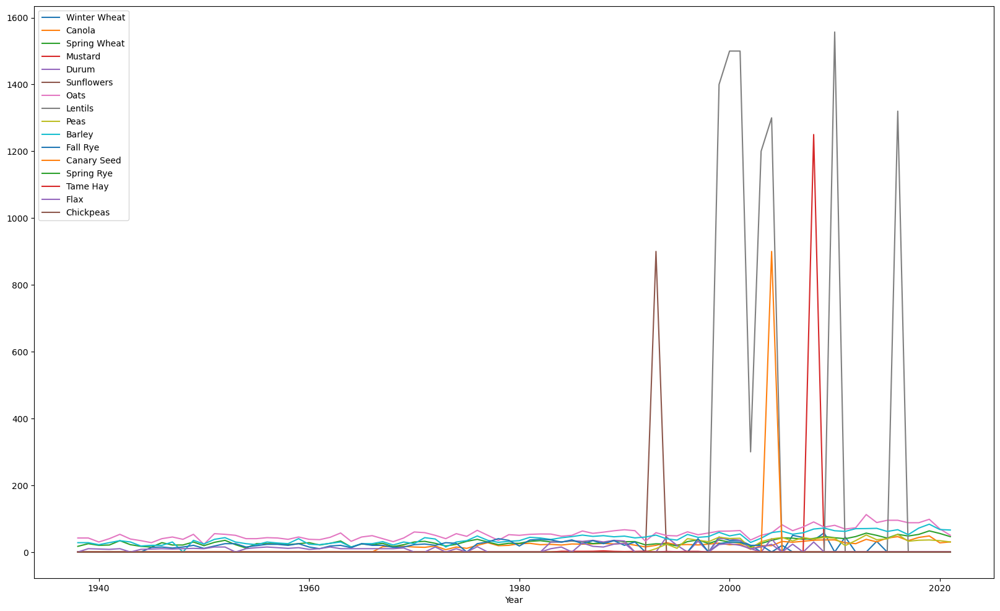

In [181]:
# Plot a line plot to visualize the crop yields for the RM 588
df4.plot.line(x='Year', y=['Winter Wheat', 'Canola', 'Spring Wheat', 'Mustard', 'Durum', 'Sunflowers', 'Oats', 'Lentils', 'Peas', 'Barley', 'Fall Rye',
       'Canary Seed', 'Spring Rye', 'Tame Hay', 'Flax', 'Chickpeas' ] )

In [182]:
display(df4.describe())

,Year,RM,Winter Wheat,Canola,Spring Wheat,Mustard,Durum,Sunflowers,Oats,Lentils,Peas,Barley,Fall Rye,Canary Seed,Spring Rye,Tame Hay,Flax,Chickpeas
count,84.000000,84.0,84.000000,84.000000,84.000000,84.000000,84.000000,84.000000,84.000000,84.000000,84.000000,84.000000,84.000000,84.000000,84.0,84.000000,84.000000,84.0
mean,1979.500000,588.0,4.737500,16.266548,30.260833,14.880952,6.204762,10.714286,54.771310,119.964286,11.939286,40.780833,14.850000,10.714286,0.0,0.310595,7.828571,0.0
std,24.392622,0.0,13.424943,13.844035,10.641611,136.386181,13.340859,98.198051,17.746187,390.207990,17.681581,16.720701,13.005953,98.198051,0.0,0.762398,8.213559,0.0
min,1938.000000,588.0,0.000000,0.000000,12.000000,0.000000,0.000000,0.000000,23.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0
25%,1958.750000,588.0,0.000000,0.000000,22.000000,0.000000,0.000000,0.000000,42.000000,0.000000,0.000000,28.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0
50%,1979.500000,588.0,0.000000,19.050000,28.200000,0.000000,0.000000,0.000000,51.850000,0.000000,0.000000,39.300000,16.500000,0.000000,0.0,0.000000,9.000000,0.0
75%,2000.250000,588.0,0.000000,25.775000,34.850000,0.000000,0.000000,0.000000,63.150000,0.000000,31.250000,51.050000,25.000000,0.000000,0.0,0.000000,13.000000,0.0
max,2021.000000,588.0,57.500000,48.100000,63.300000,1250.000000,45.000000,900.000000,112.200000,1557.000000,52.600000,83.300000,40.000000,900.000000,0.0,3.450000,30.000000,0.0


In [183]:
def percent_hbar(df4, old_threshold=None):
    percent_of_nulls = (df4.isnull().sum()/len(df)*100).sort_values().round(2)
    threshold = percent_of_nulls.mean()
    ax = percent_of_nulls.plot(kind='barh', figsize=(20, 16), title='% of NaN (from {} lines)'.format(len(df)), 
                               color='#86bf91', legend=False, fontsize=17)
    ax.set_xlabel('Count of NaN')
    dict_percent = dict(percent_of_nulls)
    i = 0
    for k in dict_percent:
        color = 'blue'
        if dict_percent[k] > 0:
            if dict_percent[k] > threshold:
                color = 'red'
            ax.text(dict_percent[k]+0.1, i + 0.09, str(dict_percent[k])+'%', color=color, 
                    fontweight='bold', fontsize='large')
        i += 0.98
    if old_threshold is not None:
        plt.axvline(x=old_threshold,linewidth=1, color='r', linestyle='--')
        ax.text(old_threshold+0.3, .10, '{0:.2%}'.format(old_threshold/100), color='r', fontweight='bold', fontsize='large')
        plt.axvline(x=threshold,linewidth=1, color='green', linestyle='--')
        ax.text(threshold+0.3, .7, '{0:.2%}'.format(threshold/100), color='green', fontweight='bold', fontsize='large')
    else:
        plt.axvline(x=threshold,linewidth=1, color='r', linestyle='--')
        ax.text(threshold+0.3, .7, '{0:.2%}'.format(threshold/100), color='r', fontweight='bold', fontsize='large')
    ax.set_xlabel('')
    return ax, threshold

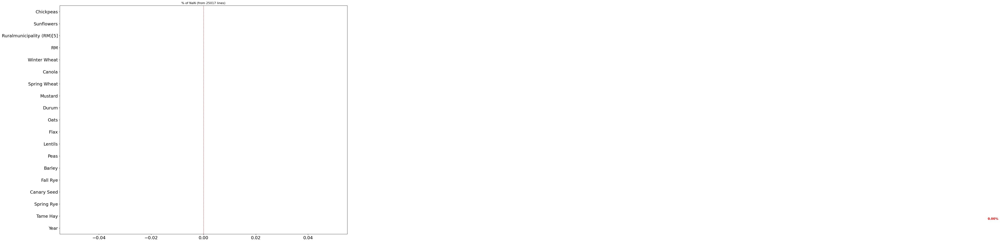

In [184]:
plot, threshold = percent_hbar(df4)

C:\Users\jason\AppData\Local\Temp\ipykernel_23348\2696219388.py:2: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  mask = np.triu(np.ones_like(df4.corr(), dtype=np.bool))


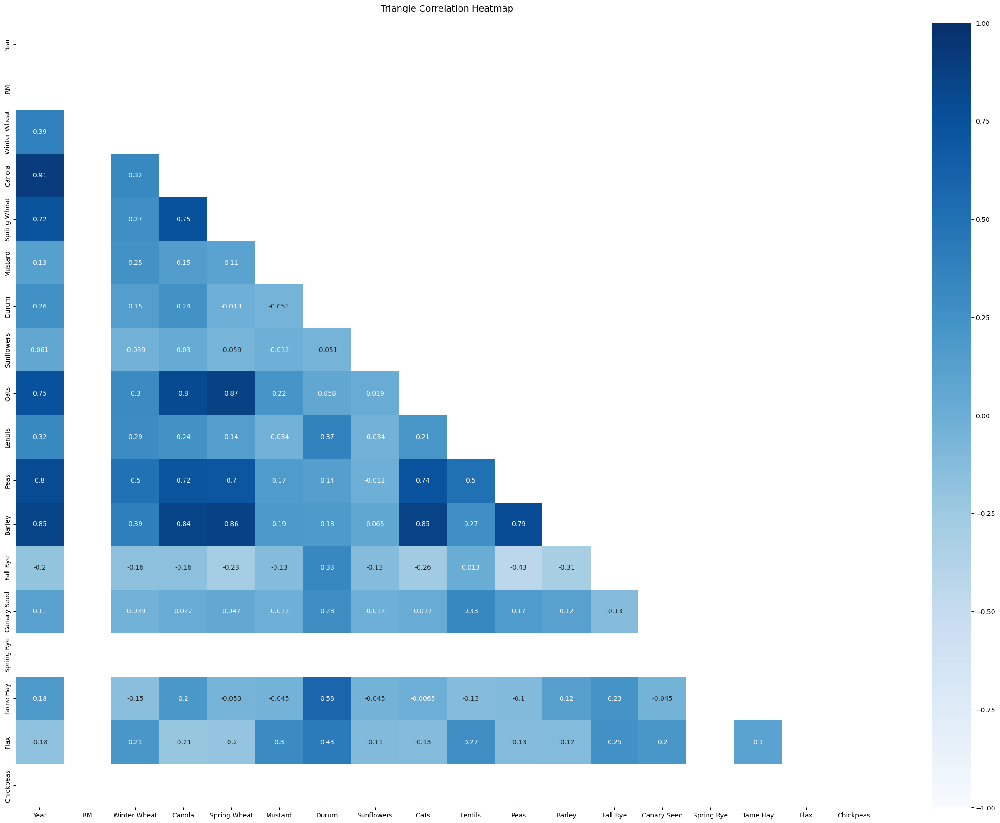

In [185]:
plt.figure(figsize=(30, 22))
mask = np.triu(np.ones_like(df4.corr(), dtype=np.bool))
heatmap = sns.heatmap(df4.corr(), mask=mask, vmin=-1, vmax=1, annot=True, cmap='Blues')
heatmap.set_title('Triangle Correlation Heatmap', fontdict={'fontsize':14}, pad=18);

<AxesSubplot:ylabel='Yield'>

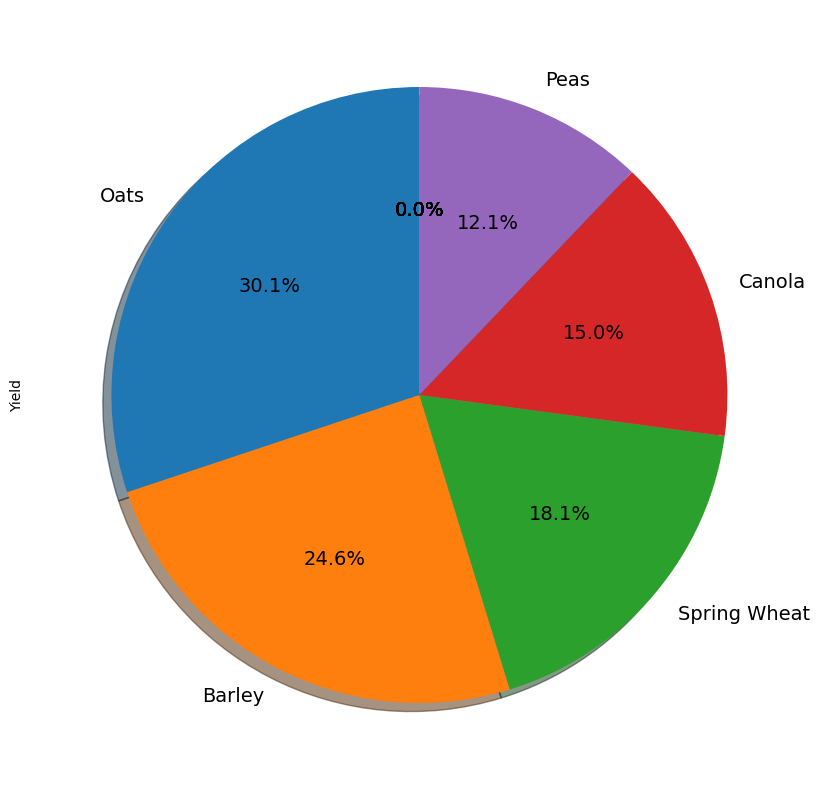

In [189]:
# Create a pie chart to visualize the total of the crop yields for the RM 588 for the year 2018
df4_2018 = df4[df4['Year'] == 2018] 
df4_2018 = df4_2018.drop(['Year', 'Ruralmunicipality (RM)[5]', 'RM'], axis=1)
df4_2018 = df4_2018.transpose()
df4_2018.columns = ['Yield']
df4_2018 = df4_2018.sort_values(by=['Yield'], ascending=False)
df4_2018.plot.pie(y='Yield', figsize=(10, 10), autopct='%1.1f%%', startangle=90, shadow=True, legend=False, fontsize=14)



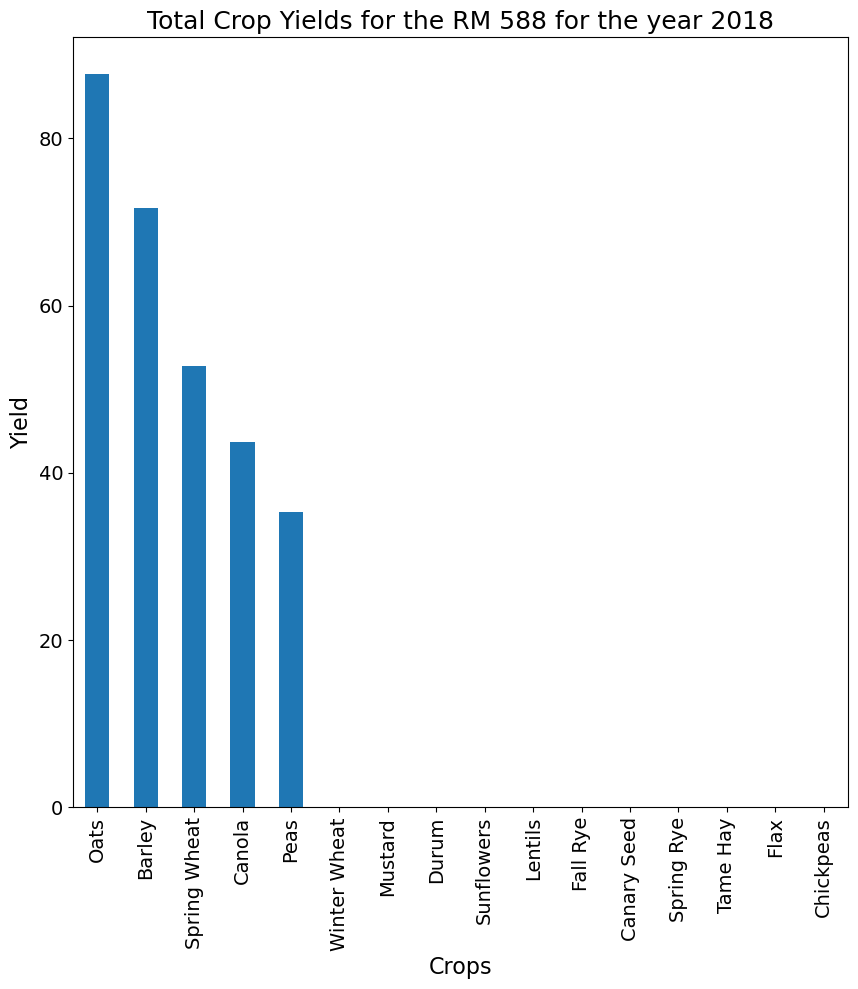

In [194]:
# create a function that makes a bar chart for the total crop yields for the RM 588 for each year include a title, labels, and legend
def bar_chart(df4, year):
    df4_year = df4[df4['Year'] == year] 
    df4_year = df4_year.drop(['Year', 'Ruralmunicipality (RM)[5]', 'RM'], axis=1)
    df4_year = df4_year.transpose()
    df4_year.columns = ['Yield']
    df4_year = df4_year.sort_values(by=['Yield'], ascending=False)
    df4_year.plot.bar(y='Yield', figsize=(10, 10), legend=False, fontsize=14)
    plt.title('Total Crop Yields for the RM 588 for the year {}'.format(year), fontsize=18)
    plt.xlabel('Crops', fontsize=16)
    plt.ylabel('Yield', fontsize=16)
    plt.show()

bar_chart(df4, 2018) # call the function for the year 2018



In [209]:
# create a function that drops the columns that have values of 0
def drop_zero(df5):
    df5 = df5.drop(['Winter Wheat', 'Canola', 'Spring Wheat', 'Mustard', 'Durum', 'Sunflowers', 'Oats', 'Lentils', 'Peas', 'Barley', 'Fall Rye',
       'Canary Seed', 'Spring Rye', 'Tame Hay', 'Flax', 'Chickpeas' ], axis=1)
    df5 = df5[(df5.T != 0).any()]
    return df5

    

In [210]:
df4

,Year,Ruralmunicipality (RM)[5],RM,Winter Wheat,Canola,Spring Wheat,Mustard,Durum,Sunflowers,Oats,Lentils,Peas,Barley,Fall Rye,Canary Seed,Spring Rye,Tame Hay,Flax,Chickpeas
24849,1938,Meadow Lake No. 588,588,0.0,0.00,17.00,0.0,0.0,0.0,42.00,0.0,0.0,28.0,0.0,0.0,0.0,0.0,0.0,0.0
24850,1939,Meadow Lake No. 588,588,0.0,0.00,25.00,0.0,0.0,0.0,42.00,0.0,0.0,28.0,0.0,0.0,0.0,0.0,10.0,0.0
24851,1940,Meadow Lake No. 588,588,0.0,0.00,20.00,0.0,0.0,0.0,30.00,0.0,0.0,22.0,0.0,0.0,0.0,0.0,9.0,0.0
24852,1941,Meadow Lake No. 588,588,0.0,0.00,21.00,0.0,0.0,0.0,40.00,0.0,0.0,28.0,0.0,0.0,0.0,0.0,8.0,0.0
24853,1942,Meadow Lake No. 588,588,0.0,0.00,34.00,0.0,0.0,0.0,53.00,0.0,0.0,34.0,0.0,0.0,0.0,0.0,10.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24928,2017,Meadow Lake No. 588,588,0.0,34.06,47.91,0.0,0.0,0.0,87.72,0.0,32.3,52.1,0.0,0.0,0.0,0.0,0.0,0.0
24929,2018,Meadow Lake No. 588,588,0.0,43.70,52.80,0.0,0.0,0.0,87.70,0.0,35.3,71.7,0.0,0.0,0.0,0.0,0.0,0.0
24930,2019,Meadow Lake No. 588,588,0.0,48.10,63.30,0.0,0.0,0.0,98.00,0.0,36.1,83.3,0.0,0.0,0.0,0.0,0.0,0.0
24931,2020,Meadow Lake No. 588,588,0.0,27.50,55.60,0.0,0.0,0.0,69.30,0.0,34.0,67.4,0.0,0.0,0.0,0.0,0.0,0.0


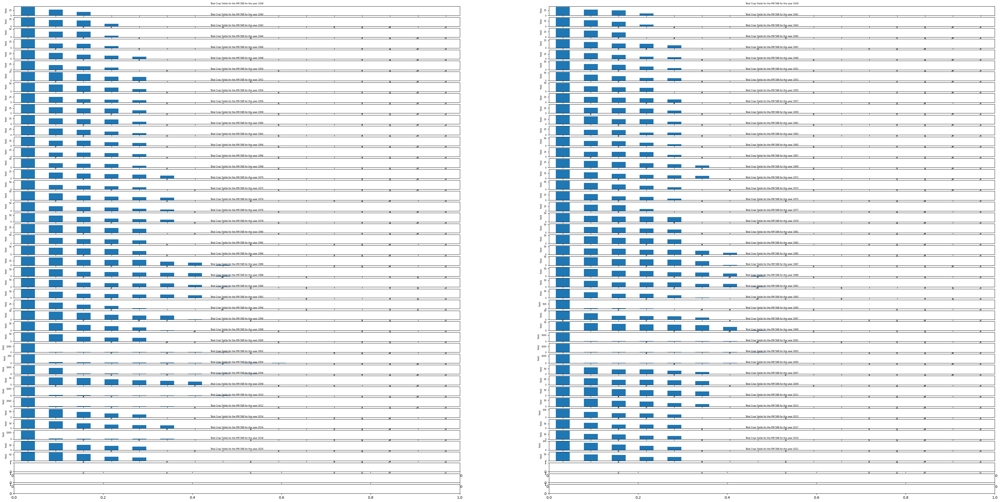

In [203]:
# create a function that makes a bar chart for the total crop yields for the RM 588 for each year include a title, labels, and legend
def bar_chart(ax, df4, year):
    df4_year = df4[df4['Year'] == year] 
    df4_year = df4_year.drop(['Year', 'Ruralmunicipality (RM)[5]', 'RM'], axis=1)
    df4_year = df4_year.transpose()
    df4_year.columns = ['Yield']
    df4_year = df4_year.sort_values(by=['Yield'], ascending=False)
    df4_year.plot.bar(y='Yield', ax=ax, legend=False, fontsize=6)
    ax.set_title('Total Crop Yields for the RM 588 for the year {}'.format(year), fontsize=6)
    ax.set_xlabel('Crops', fontsize=6)
    ax.set_ylabel('Yield', fontsize=6)

years = df4['Year'].unique()

fig, axs = plt.subplots(nrows=45, ncols=2, figsize=(50, 25))
axs = axs.ravel()

for i, year in enumerate(years):
    bar_chart(axs[i], df4, year)

plt.show()


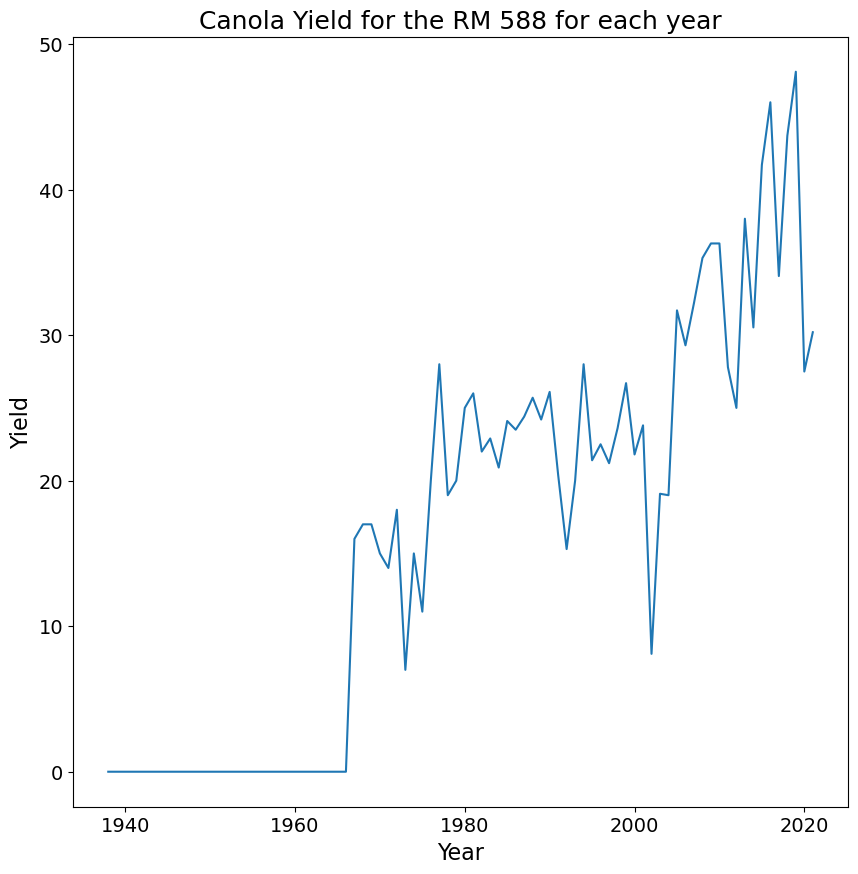

In [211]:
# create a line chart for the canola yield for the RM 588 for each year
df4_canola = df4[['Year', 'Canola']]
df4_canola = df4_canola[(df4_canola.T != 0).any()]
df4_canola.plot.line(x='Year', y='Canola', figsize=(10, 10), legend=False, fontsize=14)
plt.title('Canola Yield for the RM 588 for each year', fontsize=18)
plt.xlabel('Year', fontsize=16)
plt.ylabel('Yield', fontsize=16)
plt.show()


IndexError: index 5 is out of bounds for axis 0 with size 5

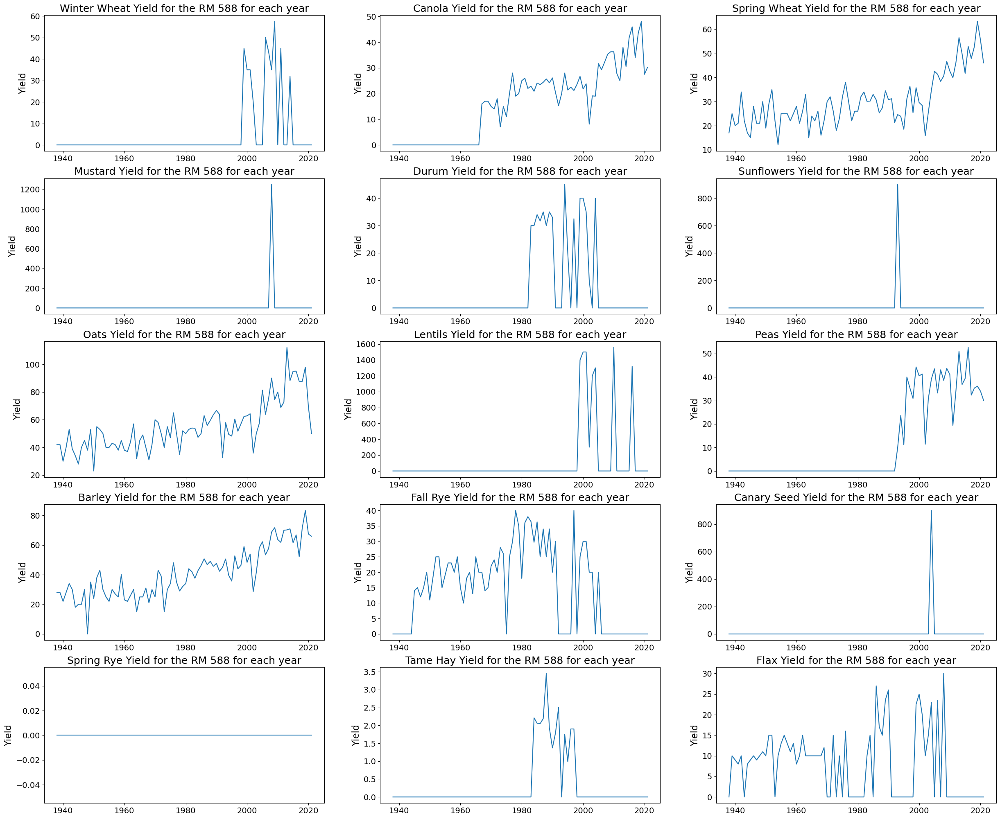

In [216]:
import math

# create a line chart for each crop yield for the RM 588 for each year
crops = ['Winter Wheat', 'Canola', 'Spring Wheat', 'Mustard', 'Durum', 'Sunflowers', 'Oats', 'Lentils', 'Peas', 'Barley', 'Fall Rye', 'Canary Seed', 'Spring Rye', 'Tame Hay', 'Flax', 'Chickpeas']
num_plots = len(crops)

# set up the subplot grid
num_rows = 5
num_cols = 3
fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(30, 25))

# loop through the crops and create a line chart for each one
for i, crop in enumerate(crops):
    row = math.floor(i / num_cols)
    col = i % num_cols
    ax = axes[row][col]
    df_crop = df4[['Year', crop]]
    df_crop = df_crop[(df_crop.T != 0).any()]
    df_crop.plot.line(x='Year', y=crop, ax=ax, legend=False, fontsize=14)
    ax.set_title('{} Yield for the RM 588 for each year'.format(crop), fontsize=18)
    ax.set_xlabel('', fontsize=16)
    ax.set_ylabel('Yield', fontsize=16)

plt.show()


In [249]:
df4_sum = df4.groupby(crops).sum().reset_index()

In [250]:
df4_sum

,Winter Wheat,Canola,Spring Wheat,Mustard,Durum,Sunflowers,Oats,Lentils,Peas,Barley,Fall Rye,Canary Seed,Spring Rye,Tame Hay,Flax,Chickpeas,Year,RM
0,0.0,0.0,12.0,0.0,0.0,0.0,40.0,0.0,0.0,25.0,15.0,0.0,0.0,0.0,10.0,0.0,1954,588
1,0.0,0.0,15.0,0.0,0.0,0.0,28.0,0.0,0.0,20.0,14.0,0.0,0.0,0.0,9.0,0.0,1945,588
2,0.0,0.0,15.0,0.0,0.0,0.0,32.0,0.0,0.0,15.0,13.0,0.0,0.0,0.0,10.0,0.0,1964,588
3,0.0,0.0,17.0,0.0,0.0,0.0,34.0,0.0,0.0,18.0,0.0,0.0,0.0,0.0,8.0,0.0,1944,588
4,0.0,0.0,17.0,0.0,0.0,0.0,42.0,0.0,0.0,28.0,0.0,0.0,0.0,0.0,0.0,0.0,1938,588
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79,43.5,32.2,38.4,0.0,0.0,0.0,75.1,0.0,43.1,57.6,0.0,0.0,0.0,0.0,0.0,0.0,2007,588
80,45.0,26.7,35.8,0.0,40.0,0.0,62.4,1400.0,44.3,59.0,25.0,0.0,0.0,0.0,22.5,0.0,1999,588
81,45.0,27.8,39.9,0.0,0.0,0.0,68.8,0.0,19.4,61.8,0.0,0.0,0.0,0.0,0.0,0.0,2011,588
82,50.0,29.3,41.4,0.0,0.0,0.0,63.9,0.0,33.2,53.4,0.0,0.0,0.0,0.0,23.5,0.0,2006,588


In [251]:
# find the total yield for each crop for the RM 588
df4_sum = df4.groupby(crops).sum().reset_index()
#df4_sum = df4_sum.drop(['Year'], axis=1)
df4_sum = df4_sum.transpose()



In [252]:
df4_sum

,0,1,2,3,4,5,6,7,8,9,...,74,75,76,77,78,79,80,81,82,83
Winter Wheat,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,20.0,31.95,35.0,35.0,35.0,43.5,45.0,45.0,50.0,57.5
Canola,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,8.1,30.53,21.8,23.8,35.3,32.2,26.7,27.8,29.3,36.3
Spring Wheat,12.0,15.0,15.0,17.0,17.0,19.0,20.0,21.0,21.0,21.0,...,15.8,49.87,29.6,28.4,40.6,38.4,35.8,39.9,41.4,46.7
Mustard,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.00,0.0,0.0,1250.0,0.0,0.0,0.0,0.0,0.0
Durum,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,10.0,0.00,40.0,35.0,0.0,0.0,40.0,0.0,0.0,0.0
Sunflowers,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Oats,40.0,28.0,32.0,34.0,42.0,23.0,30.0,37.0,38.0,40.0,...,35.9,88.26,62.8,64.3,90.1,75.1,62.4,68.8,63.9,74.5
Lentils,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,300.0,0.00,1500.0,1500.0,0.0,0.0,1400.0,0.0,0.0,0.0
Peas,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,11.4,36.80,40.5,41.3,38.6,43.1,44.3,19.4,33.2,43.7
Barley,25.0,20.0,15.0,18.0,28.0,24.0,22.0,22.0,0.0,28.0,...,28.6,70.90,48.3,53.9,68.8,57.6,59.0,61.8,53.4,71.7


In [236]:
# drop the row RM from df4_sum and add a column named Yield that contains the total sum for each crop
df4_sum = df4_sum.drop(['RM'])


In [237]:
df4_sum

,0,1,2,3,4,5,6,7,8,9,...,74,75,76,77,78,79,80,81,82,83
Winter Wheat,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,20.0,31.95,35.0,35.0,35.0,43.5,45.0,45.0,50.0,57.5
Canola,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,8.1,30.53,21.8,23.8,35.3,32.2,26.7,27.8,29.3,36.3
Spring Wheat,12.0,15.0,15.0,17.0,17.0,19.0,20.0,21.0,21.0,21.0,...,15.8,49.87,29.6,28.4,40.6,38.4,35.8,39.9,41.4,46.7
Mustard,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.00,0.0,0.0,1250.0,0.0,0.0,0.0,0.0,0.0
Durum,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,10.0,0.00,40.0,35.0,0.0,0.0,40.0,0.0,0.0,0.0
Sunflowers,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Oats,40.0,28.0,32.0,34.0,42.0,23.0,30.0,37.0,38.0,40.0,...,35.9,88.26,62.8,64.3,90.1,75.1,62.4,68.8,63.9,74.5
Lentils,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,300.0,0.00,1500.0,1500.0,0.0,0.0,1400.0,0.0,0.0,0.0
Peas,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,11.4,36.80,40.5,41.3,38.6,43.1,44.3,19.4,33.2,43.7
Barley,25.0,20.0,15.0,18.0,28.0,24.0,22.0,22.0,0.0,28.0,...,28.6,70.90,48.3,53.9,68.8,57.6,59.0,61.8,53.4,71.7


In [254]:
# create a column named Yield that contains the total sum for each crop
df4_sum['Yield'] = df4_sum.sum(axis=1)
df4_sum

,0,1,2,3,4,5,6,7,8,9,...,75,76,77,78,79,80,81,82,83,Yield
Winter Wheat,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,31.95,35.0,35.0,35.0,43.5,45.0,45.0,50.0,57.5,397.95
Canola,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,30.53,21.8,23.8,35.3,32.2,26.7,27.8,29.3,36.3,1366.39
Spring Wheat,12.0,15.0,15.0,17.0,17.0,19.0,20.0,21.0,21.0,21.0,...,49.87,29.6,28.4,40.6,38.4,35.8,39.9,41.4,46.7,2541.91
Mustard,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.00,0.0,0.0,1250.0,0.0,0.0,0.0,0.0,0.0,1250.00
Durum,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.00,40.0,35.0,0.0,0.0,40.0,0.0,0.0,0.0,521.20
Sunflowers,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,900.00
Oats,40.0,28.0,32.0,34.0,42.0,23.0,30.0,37.0,38.0,40.0,...,88.26,62.8,64.3,90.1,75.1,62.4,68.8,63.9,74.5,4600.79
Lentils,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.00,1500.0,1500.0,0.0,0.0,1400.0,0.0,0.0,0.0,10077.00
Peas,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,36.80,40.5,41.3,38.6,43.1,44.3,19.4,33.2,43.7,1002.90
Barley,25.0,20.0,15.0,18.0,28.0,24.0,22.0,22.0,0.0,28.0,...,70.90,48.3,53.9,68.8,57.6,59.0,61.8,53.4,71.7,3425.59


In [255]:
# sort the values in the Yield column in descending order
df4_sum = df4_sum.sort_values(by=['Yield'], ascending=False)
df4_sum

,0,1,2,3,4,5,6,7,8,9,...,75,76,77,78,79,80,81,82,83,Yield
Year,1954.0,1945.0,1964.0,1944.0,1938.0,1950.0,1940.0,1961.0,1948.0,1941.0,...,2014.00,2000.0,2001.0,2008.0,2007.0,1999.0,2011.0,2006.0,2009.0,166278.00
RM,588.0,588.0,588.0,588.0,588.0,588.0,588.0,588.0,588.0,588.0,...,588.00,588.0,588.0,588.0,588.0,588.0,588.0,588.0,588.0,49392.00
Lentils,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.00,1500.0,1500.0,0.0,0.0,1400.0,0.0,0.0,0.0,10077.00
Oats,40.0,28.0,32.0,34.0,42.0,23.0,30.0,37.0,38.0,40.0,...,88.26,62.8,64.3,90.1,75.1,62.4,68.8,63.9,74.5,4600.79
Barley,25.0,20.0,15.0,18.0,28.0,24.0,22.0,22.0,0.0,28.0,...,70.90,48.3,53.9,68.8,57.6,59.0,61.8,53.4,71.7,3425.59
Spring Wheat,12.0,15.0,15.0,17.0,17.0,19.0,20.0,21.0,21.0,21.0,...,49.87,29.6,28.4,40.6,38.4,35.8,39.9,41.4,46.7,2541.91
Canola,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,30.53,21.8,23.8,35.3,32.2,26.7,27.8,29.3,36.3,1366.39
Mustard,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.00,0.0,0.0,1250.0,0.0,0.0,0.0,0.0,0.0,1250.00
Fall Rye,15.0,14.0,13.0,0.0,0.0,11.0,0.0,10.0,15.0,0.0,...,0.00,30.0,30.0,0.0,0.0,25.0,0.0,0.0,0.0,1247.40
Peas,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,36.80,40.5,41.3,38.6,43.1,44.3,19.4,33.2,43.7,1002.90


In [241]:
# create a new dataframe that contains only the Yield column
df4_sum = df4_sum[['Yield']]
df4_sum

,Yield
Lentils,10077.00
Oats,4600.79
Barley,3425.59
Spring Wheat,2541.91
Canola,1366.39
Mustard,1250.00
Fall Rye,1247.40
Peas,1002.90
Sunflowers,900.00
Canary Seed,900.00


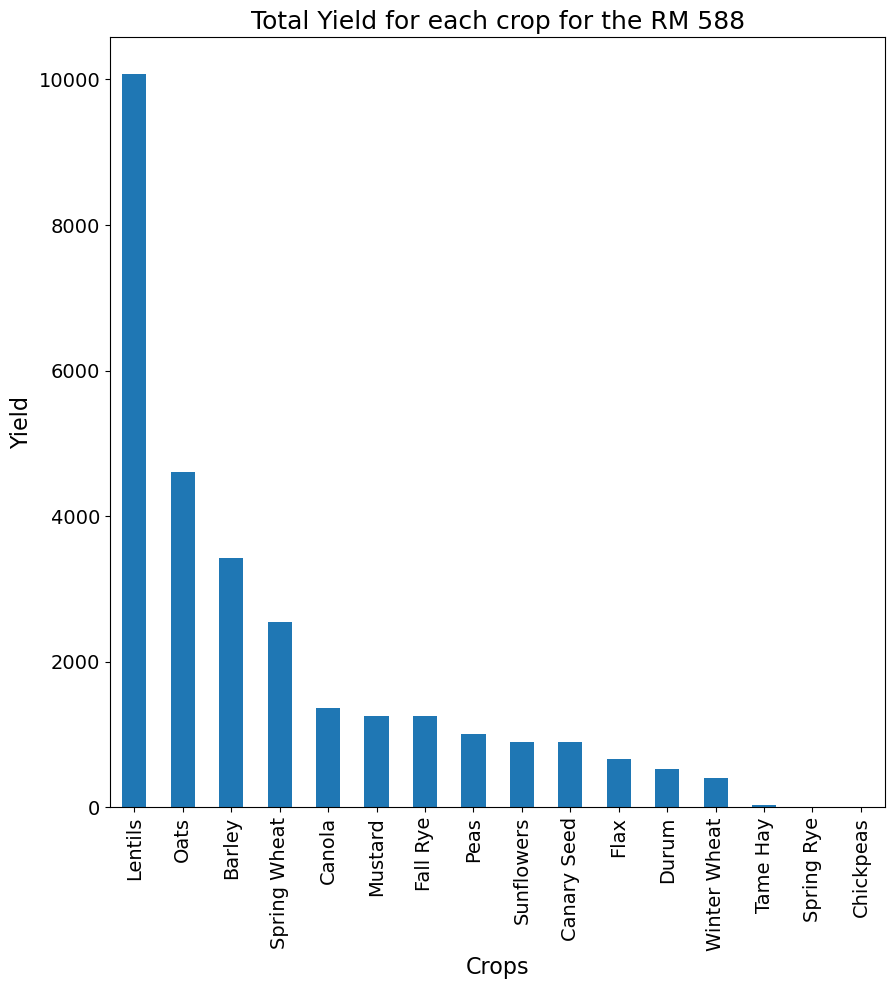

In [246]:
# create a bar chart for the total yield for each crop for the RM 588
df4_sum.plot.bar(y='Yield', figsize=(10, 10), legend=False, fontsize=14)
plt.title('Total Yield for each crop for the RM 588', fontsize=18)
plt.xlabel('Crops', fontsize=16)
plt.ylabel('Yield', fontsize=16)
plt.show()



In [247]:
df4

,Year,Ruralmunicipality (RM)[5],RM,Winter Wheat,Canola,Spring Wheat,Mustard,Durum,Sunflowers,Oats,Lentils,Peas,Barley,Fall Rye,Canary Seed,Spring Rye,Tame Hay,Flax,Chickpeas
24849,1938,Meadow Lake No. 588,588,0.0,0.00,17.00,0.0,0.0,0.0,42.00,0.0,0.0,28.0,0.0,0.0,0.0,0.0,0.0,0.0
24850,1939,Meadow Lake No. 588,588,0.0,0.00,25.00,0.0,0.0,0.0,42.00,0.0,0.0,28.0,0.0,0.0,0.0,0.0,10.0,0.0
24851,1940,Meadow Lake No. 588,588,0.0,0.00,20.00,0.0,0.0,0.0,30.00,0.0,0.0,22.0,0.0,0.0,0.0,0.0,9.0,0.0
24852,1941,Meadow Lake No. 588,588,0.0,0.00,21.00,0.0,0.0,0.0,40.00,0.0,0.0,28.0,0.0,0.0,0.0,0.0,8.0,0.0
24853,1942,Meadow Lake No. 588,588,0.0,0.00,34.00,0.0,0.0,0.0,53.00,0.0,0.0,34.0,0.0,0.0,0.0,0.0,10.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24928,2017,Meadow Lake No. 588,588,0.0,34.06,47.91,0.0,0.0,0.0,87.72,0.0,32.3,52.1,0.0,0.0,0.0,0.0,0.0,0.0
24929,2018,Meadow Lake No. 588,588,0.0,43.70,52.80,0.0,0.0,0.0,87.70,0.0,35.3,71.7,0.0,0.0,0.0,0.0,0.0,0.0
24930,2019,Meadow Lake No. 588,588,0.0,48.10,63.30,0.0,0.0,0.0,98.00,0.0,36.1,83.3,0.0,0.0,0.0,0.0,0.0,0.0
24931,2020,Meadow Lake No. 588,588,0.0,27.50,55.60,0.0,0.0,0.0,69.30,0.0,34.0,67.4,0.0,0.0,0.0,0.0,0.0,0.0


In [256]:
df4_sum

,0,1,2,3,4,5,6,7,8,9,...,75,76,77,78,79,80,81,82,83,Yield
Year,1954.0,1945.0,1964.0,1944.0,1938.0,1950.0,1940.0,1961.0,1948.0,1941.0,...,2014.00,2000.0,2001.0,2008.0,2007.0,1999.0,2011.0,2006.0,2009.0,166278.00
RM,588.0,588.0,588.0,588.0,588.0,588.0,588.0,588.0,588.0,588.0,...,588.00,588.0,588.0,588.0,588.0,588.0,588.0,588.0,588.0,49392.00
Lentils,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.00,1500.0,1500.0,0.0,0.0,1400.0,0.0,0.0,0.0,10077.00
Oats,40.0,28.0,32.0,34.0,42.0,23.0,30.0,37.0,38.0,40.0,...,88.26,62.8,64.3,90.1,75.1,62.4,68.8,63.9,74.5,4600.79
Barley,25.0,20.0,15.0,18.0,28.0,24.0,22.0,22.0,0.0,28.0,...,70.90,48.3,53.9,68.8,57.6,59.0,61.8,53.4,71.7,3425.59
Spring Wheat,12.0,15.0,15.0,17.0,17.0,19.0,20.0,21.0,21.0,21.0,...,49.87,29.6,28.4,40.6,38.4,35.8,39.9,41.4,46.7,2541.91
Canola,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,30.53,21.8,23.8,35.3,32.2,26.7,27.8,29.3,36.3,1366.39
Mustard,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.00,0.0,0.0,1250.0,0.0,0.0,0.0,0.0,0.0,1250.00
Fall Rye,15.0,14.0,13.0,0.0,0.0,11.0,0.0,10.0,15.0,0.0,...,0.00,30.0,30.0,0.0,0.0,25.0,0.0,0.0,0.0,1247.40
Peas,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,36.80,40.5,41.3,38.6,43.1,44.3,19.4,33.2,43.7,1002.90
